## Домашнее задание 3 (10 баллов)

## НИУ ВШЭ, 2024-25 учебный год

## Формат сдачи

Сам ноутбук называйте в формате hw-03-USERNAME.ipynb, где USERNAME — ваши фамилия и имя. Файл надо будет сдать в anytask.

## О задании

В этом домашнем задании вы получите опыт подготовки данных и EDA (Exploratory Data Analysis), приблизившись к реальной работе с данными с помощью уже знакомых вам инструментов: numpy, pandas, matplotlib и seaborn, а также познакомитесь с plotly.

EDA - важный этап работы с данными. Именно в процессе EDA вы можете выяснить особенности датасета, найти зависимости в данных, протестировать гипотезы о взаимосвязях признаков и целевой переменной. В реальности вы сами будете определять, что и как проверять в рамках EDA, однако в данной работе гипотезы будут выдвинуты за вас автором задания. Также и типы графиков, которые вы будете использовать уже предопределены за вас. Выполняя задания по визуализациям, обращайте внимание на референсные картинки, которые были оставлены авторами. Они показывают, какой примерно результат от вас ожидается.

Это задание будет включать в себя построение некоторого количества графиков, потому вот основные правила, в соответствии с которыми графики должны быть оформлены:
1. Любой график всегда имеет название.
2. Оси у графика подписаны (исключение - график делит название оси с соседним).
3. Подписи делаются на одном языке (либо английский, либо русский), но не на их смеси.
4. Если вы выводите несколько графиков, то они размещаются в рамках одного объекта matplotlib.pyplot.figure. Вы не выводите графики последовательно, а смотрите, как их разместить сразу все за раз.
5. Отдельные графики (если графиков на картинке больше 1) также имеют свои названия.
6. Если на графике есть несколько различных объектов, то для их различения используется легенда. Помещайте легенду в место, где она в наименьшей мере мешает восприятию самого графика.
7. Если есть легенда, то она должна иметь навание, а также ее содержание должно быть адекватными (пожалейте проверяющих, они не хотят разбирать, а к чему относится зеленая линия, которая на легенде помечена меткой "0").
8. Используйте цветовые гаммы, чтобы объекты на графиках отличались цветом.
9. Текст на визуализации должен быть читаем. Если вы вывели названия категорий в качестве подписей на оси Х, а эти названия наезжают друг на друга, то вам нужно что-то с этим сделать. Нечитаемый или плохо читаемый (очень маленький, невероятно огромный) текст ведет к снижению баллов.

При работе с табличными данными используйте функционал [style](https://pandas.pydata.org/docs/user_guide/style.html#Builtin-Styles), чтобы визуально выделять необходимые элементы.

В этом задании будут оцениваться ваши развернутые комментарии, размышления и выводы (по построенным графикам): не скупитесь на них, но следите, чтобы выводы не были поверхностными и очевидными.

*Тут правило про плагиат, которое вам итак известно - обнуляются все работы, которые подозреваются в некорректных заимствованиях!* Помните, что просто скопировать код из интернета и указать источник - это не ваша самостоятельная работа, а автора кода. Измените хоть что-нибудь в коде.

## О данных

Будем работать с [датасетом физической активности](https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones).

В этом датасете собраны данные 30 человек, выполняющих различные действия со смартфоном на поясе. Данные записывались с помощью датчиков (акселерометра и гироскопа) в этом смартфоне. Были зафиксированы: "3-осевое линейное ускорение" (_tAcc-XYZ_) и "3-осевая угловая скорость" (_tGyro-XYZ_).

1. Все сигналы отсортированы по времени, пропущены через фильтр шума.
2. Все наблюдения были разделены на окна по 128 сигналов в каждом, причем окна пересекаются на 50% (грубо говоря, с 1 по 128 сигнал в 1 окно, с 64 до 192 сигнала - во 2 окно и так далее). То есть каждое окно покрывает 2.56 секунды данных (два шага человека при ходьбе, учитывая медленную походку пожилых людей).
3. Линейное ускорение было разделено на две составляющие (с помощью низкочастотного фильтра): ускорение самого тела, а также гравитационная составляющая. Будем называть их ускорением тела и гравитационным ускорением.
4. К получившимся окнам применяли различные функции для получения следующих показателей:
    - max
    - min
    - mad (median)
    - mean
    - std
    - skewness (коэффициент асимметричности распределения признака в окне)
    - etc. (подробнее, на сколько это возможно, указано в [самой статье](https://www.esann.org/sites/default/files/proceedings/legacy/es2013-84.pdf))
5. Величина (magnitude) сигнала также определялась через евклидову норму всех значений из вектора для одного окна.
6. К окнам было применено преобразование Фурье, чтобы получить частоты. Из частот были извелченыте же показатели, плюс новые:
    - bandsEnergy (энергия частотного интервала)
7. Были посчитаны углы между векторами соответствующих окон.
8. Для ускорений были посчитаны производные - рывки, к которым применялись те же функции.

Итог: в датасете каждый признак - это какая-то операция над вектором из 128 чисел, которые соответствуют замерам определенного человека занятого какой-то активностью на протяжении 2.56 секунд.

Как читать названия признаков? Примеры:
- `tBodyAccMag-mean()` - это вектор ускорений тела (без гравитационной составляющей этого ускорения), из которого взяли евклидову норму, а затем усреднили, чтобы получить скаляр
- `fBodyAcc-bandsEnergy()-1,8.2` - это вектор ускорения тела, к которому применили преобразование Фурье, преобразовав его в вектор частот, а затем посчитали на этом векторе энергию данного частотного интервала в определенном диапазоне частот (в данном случае 1 - 8.2)
- `angle(X,gravityMean)` - это угол между осью Х и вектором усредненных значений гравитационного ускорения из соответствующего окна

Вероятно, сначала покажется сложным, но мы разберемся с некоторыми признаками в отдельности и вы сможете понять их смысл, уже исходя из фактических соотношений.

## Предобработка данных

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [3]:
train = pd.read_csv('train.csv')
test = pd.read_csv("test.csv")

In [4]:
train.shape

(7352, 563)

In [6]:
test.shape

(2947, 563)

В датасете 563 признака, включая целевую переменную. Столько признаков нам не нужно. Мы за вас сделали подвыборку признаков для удобства работы с ними.

# Спасибо! ^_^

In [7]:
cols_subset = [
    'tBodyAccMag-mean()',  # усредненная величина ускорения тела
    'tBodyGyroJerk-mad()-X',  # медианная величина рывка тела по оси Х
    'tGravityAcc-min()-X',  # минимум гравитационной составляющей ускорения по оси Х
    'tBodyAcc-max()-X',  # максимальная величина ускорения тела по оси Х
    'fBodyAcc-bandsEnergy()-1,8.2',  # энергия ускорения тела в интервале частоты
    'angle(X,gravityMean)',  # угол между осью Х и усредненной гравитационной составляющей ускорения
    'angle(Y,gravityMean)',  # угол между осью Y и усредненной гравитационной составляющей ускорения
    'angle(Z,gravityMean)',  # угол между осью Z и усредненной гравитационной составляющей ускорения,
    'fBodyAcc-skewness()-X',  # асимметричность частоты ускорения тела по оси Х
    'subject',  # номер испытуемого
    'Activity',  # название вида деятельности (целевая переменная)
]

In [8]:
train = train[cols_subset]
test = test[cols_subset]

### Задание 1 (0.5 балла)

Посмотрите на пропуски и дубли в данных train и test. Есть ли они? Если есть, напишите, с чем это может быть связано? Если нет, то просто напишите, что пропусков и/или дублей нет.

In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7352 entries, 0 to 7351
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tBodyAccMag-mean()            7352 non-null   float64
 1   tBodyGyroJerk-mad()-X         7352 non-null   float64
 2   tGravityAcc-min()-X           7352 non-null   float64
 3   tBodyAcc-max()-X              7352 non-null   float64
 4   fBodyAcc-bandsEnergy()-1,8.2  7352 non-null   float64
 5   angle(X,gravityMean)          7352 non-null   float64
 6   angle(Y,gravityMean)          7352 non-null   float64
 7   angle(Z,gravityMean)          7352 non-null   float64
 8   fBodyAcc-skewness()-X         7352 non-null   float64
 9   subject                       7352 non-null   int64  
 10  Activity                      7352 non-null   object 
dtypes: float64(9), int64(1), object(1)
memory usage: 631.9+ KB


In [10]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2947 entries, 0 to 2946
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tBodyAccMag-mean()            2947 non-null   float64
 1   tBodyGyroJerk-mad()-X         2947 non-null   float64
 2   tGravityAcc-min()-X           2947 non-null   float64
 3   tBodyAcc-max()-X              2947 non-null   float64
 4   fBodyAcc-bandsEnergy()-1,8.2  2947 non-null   float64
 5   angle(X,gravityMean)          2947 non-null   float64
 6   angle(Y,gravityMean)          2947 non-null   float64
 7   angle(Z,gravityMean)          2947 non-null   float64
 8   fBodyAcc-skewness()-X         2947 non-null   float64
 9   subject                       2947 non-null   int64  
 10  Activity                      2947 non-null   object 
dtypes: float64(9), int64(1), object(1)
memory usage: 253.4+ KB


#### Якобы пропусков нет, но возможно нечисловые переменные содержат данные по типу "Тут данных нет;(", поэтому проверим их отдельно

In [11]:
test["Activity"].value_counts()

Activity
LAYING                537
STANDING              532
WALKING               496
SITTING               491
WALKING_UPSTAIRS      471
WALKING_DOWNSTAIRS    420
Name: count, dtype: int64

In [12]:
train["Activity"].value_counts()

Activity
LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: count, dtype: int64

#### Пропусков не обнаружено

In [13]:
int(train.duplicated().sum())

0

In [14]:
int(test.duplicated().sum())

0

#### Дубликатов тоже не обнаружено

### Задание 2 (0.5 балла)

Выведите основные статистики данных: среднее, медиана, перцентили (0.25, 0.5, 0.75), минимум, максимум, стандартное отклонение. Посмотрите на таблицу и напишите, видите ли вы в ней что-нибудь интересное.

In [15]:
train.describe()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject
count,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000
mean,-0.543884,-0.727735,0.678505,-0.468604,-0.847963,-0.489547,0.058593,-0.056515,-0.128562,17.413085
std,0.477653,0.315832,0.508656,0.544547,0.233633,0.511807,0.297480,0.279122,0.403686,8.975143
min,-1.000000,-0.999889,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.931208,1.000000
25%,-0.983282,-0.991595,0.804270,-0.936219,-0.999480,-0.812065,-0.017885,-0.143414,-0.486841,8.000000
50%,-0.883371,-0.950268,0.926693,-0.881637,-0.986582,-0.709417,0.182071,0.003181,-0.163271,19.000000
75%,-0.106892,-0.474625,0.965095,-0.017129,-0.764508,-0.509079,0.248353,0.107659,0.155112,26.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.478157,1.000000,1.000000,30.000000


In [16]:
test.describe()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject
count,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000
mean,-0.559043,-0.735661,0.696878,-0.462063,-0.880361,-0.513923,0.074886,-0.048720,-0.154042,12.986427
std,0.439539,0.282074,0.502873,0.523916,0.160496,0.509205,0.324300,0.241467,0.392203,6.950984
min,-0.998936,-1.000000,-0.756774,-0.952357,-0.999989,-0.984195,-0.913704,-0.949228,-1.000000,2.000000
25%,-0.978433,-0.989078,0.836787,-0.934447,-0.999330,-0.829722,0.022140,-0.098485,-0.497070,9.000000
50%,-0.861830,-0.914698,0.934930,-0.852659,-0.979336,-0.729648,0.181563,-0.010671,-0.202050,12.000000
75%,-0.149596,-0.486423,0.970871,-0.009965,-0.799113,-0.545939,0.260252,0.092373,0.140254,18.000000
max,0.479547,0.117606,0.996148,0.786436,0.048730,0.833180,1.000000,0.973113,0.960367,24.000000


В последнем столбце значения сильно отличаются в датасетах. В остальном данные как будто бы похожи друг на друга. 
В первом датасете почти все значения находятся в диапазоне от -1 до 1, что приятно, а вот во втором это скорее не выполняется.

### Задание 3 (0.5 балла)

Данные сбалансированы? У вас есть 6 категорий активности (целевая переменная). Если одна из категорий представлена большим количеством наблюдений, а остальные - нет, то это обстоятельство, о котором хотелось бы знать заранее. Гиперболизированный пример: представьте, что у вас 1000 наблюдений, разделенных на два класса, и только 5 принадлежат ко второму классу. Как учить модель на такой выборке? Есть сильное подозрение, что многие модели будут склонны вырождаться в константу. Отсюда и необходимость проверять баланс классов.

Выведите количество наблюдений для всех категорий активности в train и test. Посчитайте разницу в процентах между самой крупной категорией и самой маленькой (самая большая категория - это 100%). Если разница (округленная до ближайшего целого числа) не превышает 30%, то давайте для наших целей считать, что данные сбалансированы. Напишите, сбалансированы ли данные в train и test.

In [17]:
#подобный код уже был сверху
train["Activity"].value_counts()

Activity
LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: count, dtype: int64

In [18]:
test["Activity"].value_counts()

Activity
LAYING                537
STANDING              532
WALKING               496
SITTING               491
WALKING_UPSTAIRS      471
WALKING_DOWNSTAIRS    420
Name: count, dtype: int64

In [19]:
dad = train.groupby("Activity")["subject"].count()
dad = dad.sort_values(ascending = False)
round((dad.iloc[0] - dad.iloc[-1]) / dad.iloc[0] * 100)

30

In [20]:
mam = test.groupby("Activity")["subject"].count()
mam = mam.sort_values(ascending = False)
round((mam.iloc[0] - mam.iloc[-1]) / mam.iloc[0] * 100)

22

#### Ой-ой, в данной посановке задачи наши датасеты сбалансированы, однако первый проходит прям по грани

### Задание 4 (0.5 балла)

Посчитайте корреляции всех признаков (включая таргет) со всеми другими. Какими получились значения? Есть идеи, почему так? Напишите ваши мысли.

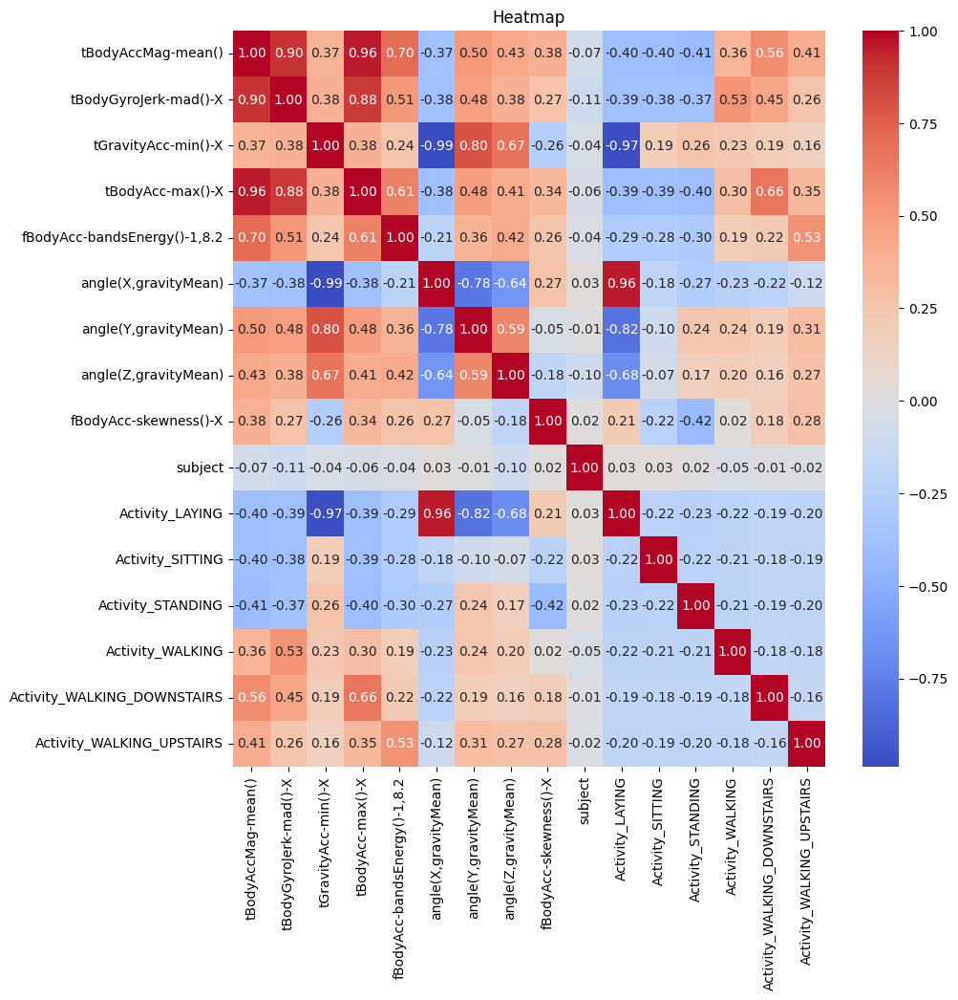

In [21]:
train_ = pd.get_dummies(train, columns=['Activity'])

plt.figure(figsize=(10, 10))
sns.heatmap(train_.corr(numeric_only =True), cmap='coolwarm',annot=True, fmt=".2f")
plt.title('Heatmap')
plt.show()

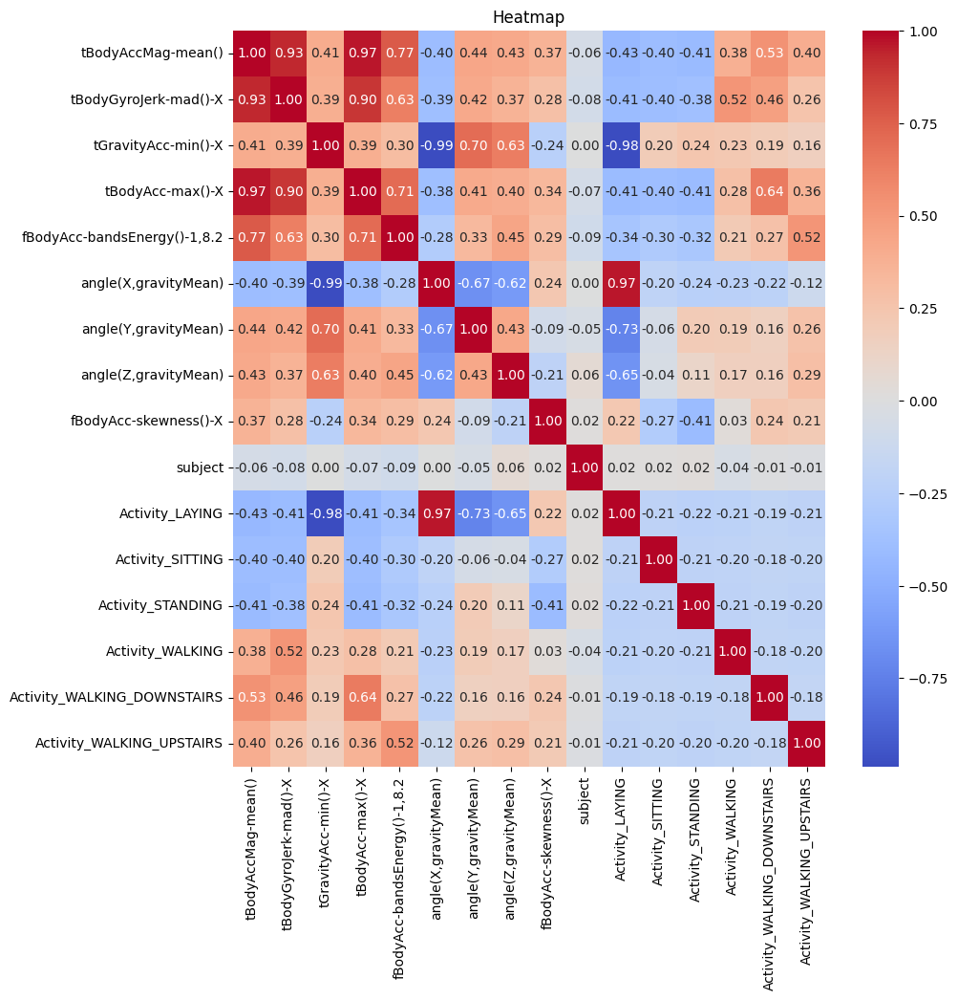

In [22]:
test_ = pd.get_dummies(test, columns=['Activity'])

plt.figure(figsize=(10, 10))
sns.heatmap(test_.corr(numeric_only =True), cmap='coolwarm',annot=True, fmt=".2f")
plt.title('Heatmap')
plt.show()

#### Видно, что до subject по строке и столбцу (левый верхний минор) в основном встречаются положительные и отличные от нуля коэффициенты. Это связано с тем, что измеряемые величины в реальной жизни косвенно связаны из-за физических процессов. Например, при беге, вероятно, будут и рывки и отличное от нуля ускорение. Более того, множество величин зависят друг от друга геометрически: например проекции на оси X, Y и Z гравитационной составляющей.

#### Subject ни с кем не коррелирует, оно и понятно! Странно было бы, если бы он коррелировал. Тогда, полагаю, пришлось бы задуматься над пользами такоцй науки как нумерология. 

#### Далее можно рассмотреть целевую переменную. Заметим, что для неактивных видов деятельности корреляция между большинством признаков отрицательная, соответственно на тепловой карте они в основном синенькие. С чем это может быть связано?

### "Скорость дерева - ноль километров в час, а почему? Потому что дерево стоит на месте!" 

#### Сидящий или прогуливающийся человек вряд ли куда-то ускоряется. Из-за специфики спокойного передвижения, вероятно, велика корреляция с проекцией гравитационного ускорения (потому-что иного просто нет).

#### Похожая логика применима к более подвижным видам активности.

Поздравляем! Вы предобработали данные для максимально комфортного их последующего анализа. 
Теперь вы готовы приступить к Exploratory Data Analysis!

## Exploratory Data Analysis

### Задание 5 (0.5 балла)

Вы проверили основную информацию о данных и составили свое первое впечатление о них. Теперь визуализации.

Начнем рисовать графики с небольшой разминки. Выберите две любые математические функции (отличные от линейной) и нарисуйте их на одном графике. Подпишите каждый из графиков, чтобы было понятно, какие функции вы выбрали. Ниже будет пример.

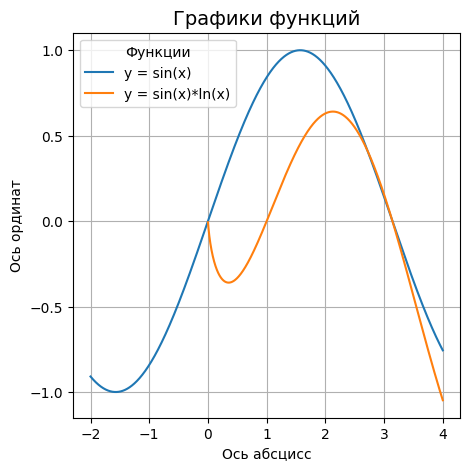

In [23]:
x = np.arange(-2, 4, 0.001)
y = np.sin(x)
z = np.sin(x)*np.log(x)

plt.figure(figsize=(5, 5))
plt.title("Графики функций", fontsize = 14)
plt.plot(x, y, label = "y = sin(x)")
plt.plot(x, z, label = "y = sin(x)*ln(x)")
plt.xlabel("Ось абсцисс", fontsize = 10)
plt.ylabel("Ось ординат", fontsize = 10)
plt.grid()
plt.legend(title='Функции')
plt.show()


### Задание 6 (0.5 балла)

Ранее мы уже проверили сбалансированность данных по разным категориям активностей в train и test сетах. Теперь визуализируйте количество сэмплов в каждой из категорий отдельно для train и test сетов, как в примере ниже. Проследите, чтобы порядок категорий слева и справа был одинаков. Иначе не очень удобно их сравнивать (когда они в разных местах двух графиков). Также заметьте, что в примере ось Х в одинаковом масштабе, что тоже удобно для сравнения.

Вам может пригодиться:
- plt.barh или ax.barh

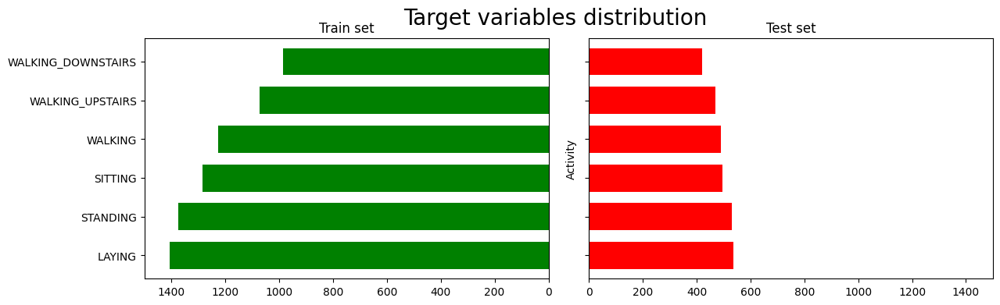

In [24]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 4), gridspec_kw={'wspace': 0.1})
fig.suptitle('Target variables distribution', fontsize=20) 

axs[0].set_title('Train set')
train["Activity"].value_counts().plot(kind='barh', ax=axs[0], color = 'green', width = 0.7)
axs[0].set_ylabel("")
axs[0].set_xlim(1500, 0)

axs[1].set_title('Test set')
test["Activity"].value_counts().plot(kind='barh', ax=axs[1], color = 'red', width = 0.7)
axs[1].set_xlim(0, 1500)
axs[1].set_yticklabels([])

plt.show()

Правда на таких графиках проще проверять баланс классов таргета?)

##### Ответ: ну, ситуативно, если никому не надо доказывать, что существует дисбаланс, то графики рисовать абсолютно ни к чему. Но если обстоятельства требуют визуализации и пруфов, тогда да

### Задание 7 (0.5 балла)

Ранее вы выводили таблицу корреляций. Однако просто таблица корреляций не очень удобна для анализа. Что, если признаков было бы больше? Визуализируйте heatmap корреляций. Подпишите значения корреляций, округленные до 2 знаков после запятой, на графике и оставьте только те значения, которые по модулю не меньше 0.5. Будем считать такие корреляции существенными. Если будете брать код из семинарского ноутбука, то поменяйте в нем что-нибудь, например, цветовую гамму, иначе проверяющий будет карать :)

Какой признак стоит исключить из рассмотрения корреляций? Напишите его название, а также причину, почему нет смысла его рассматривать.

Вам может пригодиться:
- sns.heatmap
- методы get_text и set_text у атрибута texts графика

#### Я уже делал heatmap выше, надеюсь это не проблема!

#### Кстати, я бы еще убрал корреляции, находящиеся на главной диагонали матрицы корреляций, потому что очевидно, что они будут равны единице, а лишние числа мешают восприятию информации

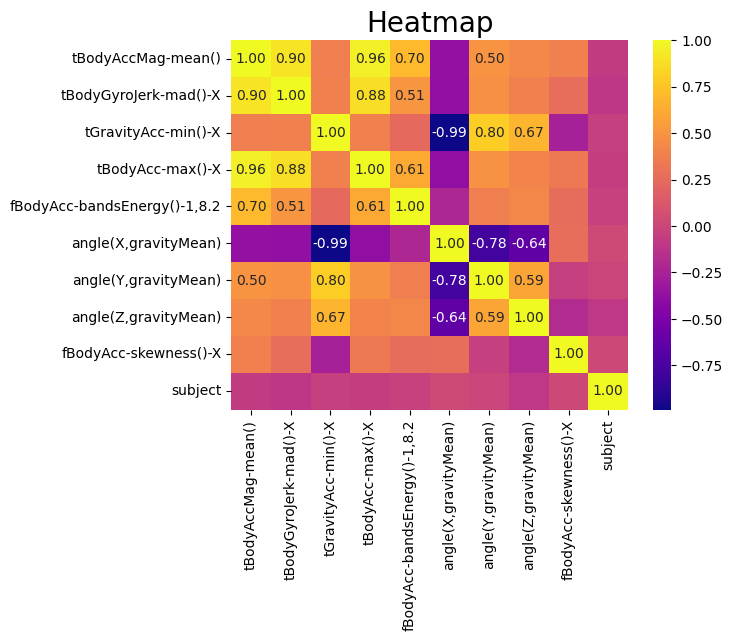

In [25]:
pl = sns.heatmap(train.corr(numeric_only = True), cmap='plasma',annot=True, fmt=".2f")
plt.title("Heatmap",fontsize = 20)
for i in pl.texts:
    if abs(float(i.get_text())) >= 0.5:
        i.set_text(i.get_text())
    else:
        i.set_text("")

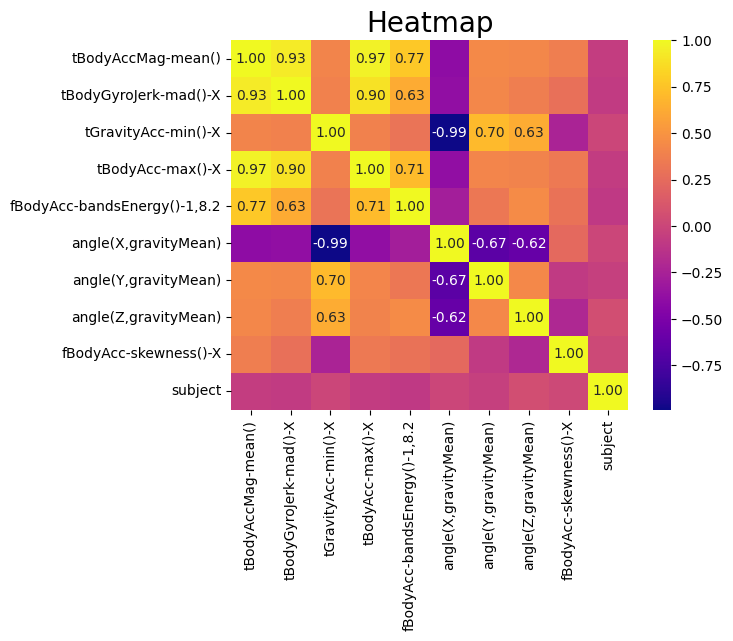

In [26]:
pl = sns.heatmap(test.corr(numeric_only = True), cmap='plasma',annot=True, fmt=".2f")
plt.title("Heatmap",fontsize = 20)
for i in pl.texts:
    if abs(float(i.get_text())) >= 0.5:
        i.set_text(i.get_text())
    else:
        i.set_text("")

#### Как я уже говорил ранее я вижу смысл убрать только поле subject, потому что в нем не содержится никакой важной информации по человеку. 

#### Другие признаки могут сильно коррелировать или слабо коррелировать, но очень сильная или, наоборот, очень слабая корреляция не дает нам никакого права на отсеивание признаков, потому что корреляция говорит только о линейной зависимости признаков! (для некоторых алгоритмов машинного обучения линейная зависимость признаков критична, однако тут я хочу подчеркнуть, что прежде чем выкидывать признак, нужно попытаться разобраться в причинах высокой или низкой корреляции) А в нашей жизни встречаются не только такие простые зависимости, поэтому исходить нужно из здравого смысла и четких рассуждений.

#### Усредненная величина ускорения тела сильно коррелирует с максимальной величиной ускорения по простой причине:

#### Люди ускоряются относительно плавно, следовательно, вероятно, третья производная от координаты - рывок - скорее всего что-то не сильно отличающееся от константы, поэтому ускорение - интеграл от рывка - будет линейной функцией. А значит среднее значение линейно будет зависеть от максимального (так как среднее ищем по формуле первый член + последний пополам и делить на число членов). 


### Задание 8 (0.5 балла)

Для начала будем стрелять из пушки по воробьям. Выведите pairplot по всем данным train сета. Напишите, заметили ли вы в нем что-нибудь интересное, чего не было в таблицах и графиках ранее, а также сообщите, было ли вам удобно анализировать 100 графиков.

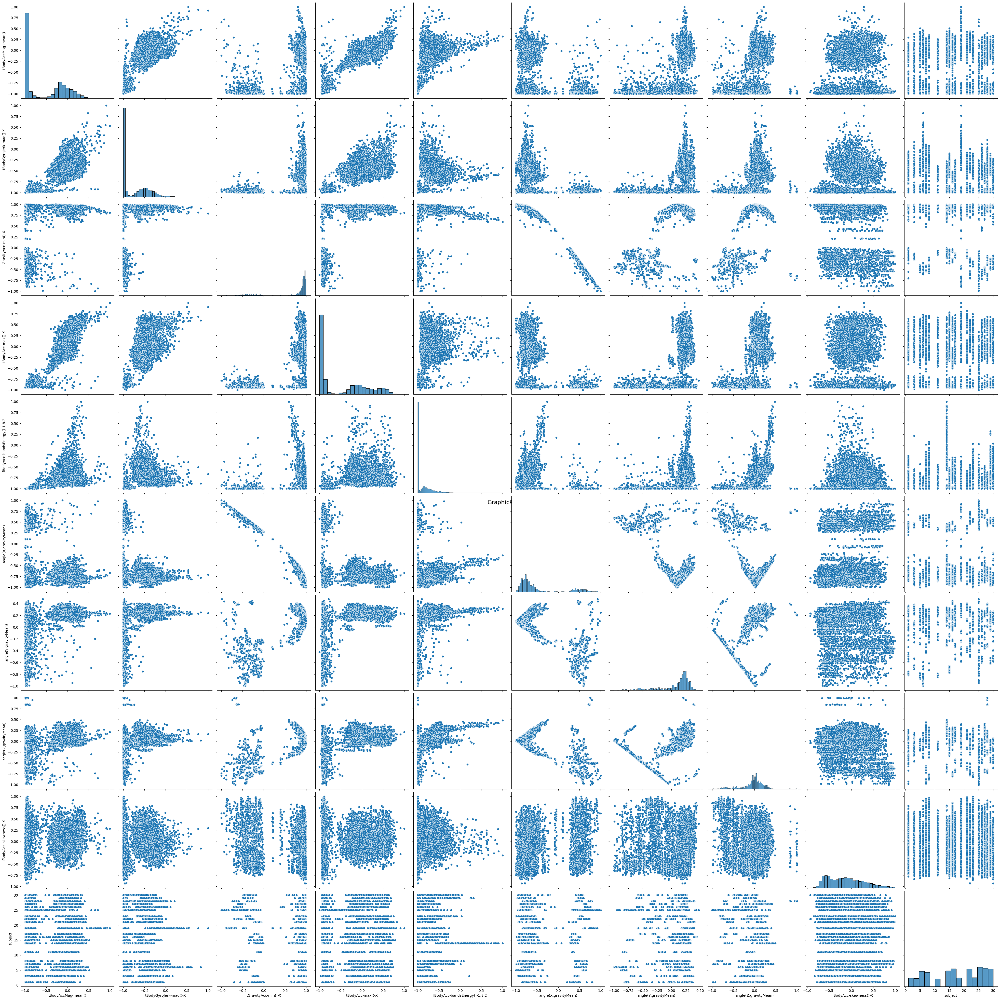

In [27]:
pair_plot = sns.pairplot(train, height = 4)
plt.suptitle("Graphics", y = 0.5,fontsize = 16) 
plt.show()

Видны различные виды зависимостей: от нормального распределения до линейной. Также часто можно встретить что-то типа квадратичной зависимости! 

Разберем кейс: А[3][6] нумерация с единицы. 

Это график зависимости минимума гравитационной составляющей ускорения по оси Х от угла между средним от проекции ускорения. Вроде как там квадрат, почему? Первая мысль - как-то с этим делом связано ускорение свободного падения, но его здесь трудно к чему-то прицепить (человек вероятно все же больше бегал, чем свободно падал). Вообразим себе ось X, совершенно не важно куда она смотрит, для опреленности пусть вниз. Представим также какой-нибудь вектор, тоже для определенности торчащий вниз. 

Угол между осью и вектором - наша независимая величина. Проекция вектора на ось X - наша зависимая величина. Из прямоугольного треугольника легко найти эту зависимую величину через косинус угла. А теперь вспомним разложение Тейлора для косинуса, и получим тот самый -x^2

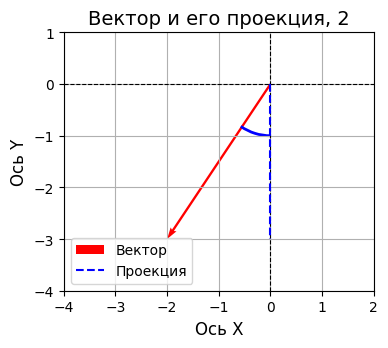

In [28]:
from matplotlib.patches import Arc

plt.figure(figsize=(4, 4))
plt.axhline(0, color='black', linewidth=0.8, linestyle='--')  # Ось X
plt.axvline(0, color='black', linewidth=0.8, linestyle='--')  # Ось Y

vector = np.array([-2, -3])  # Вектор, направленный вниз и влево
origin = np.array([0, 0])     # Начало вектора
projection = np.array([0, -3])
plt.quiver(*origin, *vector, angles='xy', scale_units='xy', scale=1, color='red', label='Вектор', linewidth=2)
plt.plot([origin[0], projection[0]], [origin[1], projection[1]], color='blue', linestyle='dashed', label='Проекция')
radius = 1 
arc = Arc([0, 0], 2 * radius, 2 * radius, angle=0, theta1=235, theta2=270, color='blue', lw=2)
plt.gca().add_patch(arc)
plt.xlim(-4, 2)
plt.ylim(-4, 1)
plt.grid()
plt.title('Вектор и его проекция, 2', fontsize=14)
plt.xlabel('Ось X', fontsize=12)
plt.ylabel('Ось Y', fontsize=12)
plt.legend()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()


### Задание 9 (1 балл)

Окей. Смотреть на все сразу не очень удобно. Кажется, нужно смотреть на признаки в отдельности и искать в них инсайты.

Попробуем проверить гипотезу. Отобразите плотность распределения (kde) `tBodyAccMag-mean()` для каждой из активностей, как в примере ниже. Видите закономерность? Можно ли поделить все активности на две группы? Если да, то проведите вертикальную линию, которая визуально неплохо разделяет эти группы.

Давайте первую группу называть статическими активностями, а вторую - динамическими.

Посчитайте, какую долю правильных ответов дает ваша вертикальная линия для разделения именно этих двух групп. С чем может быть связан полученный вами результат? Предположите логическое обоснование (почему именно данный признак так хорошо/плохо разделяет группы активностей).

Вам может пригодиться:
- sns.kdeplot

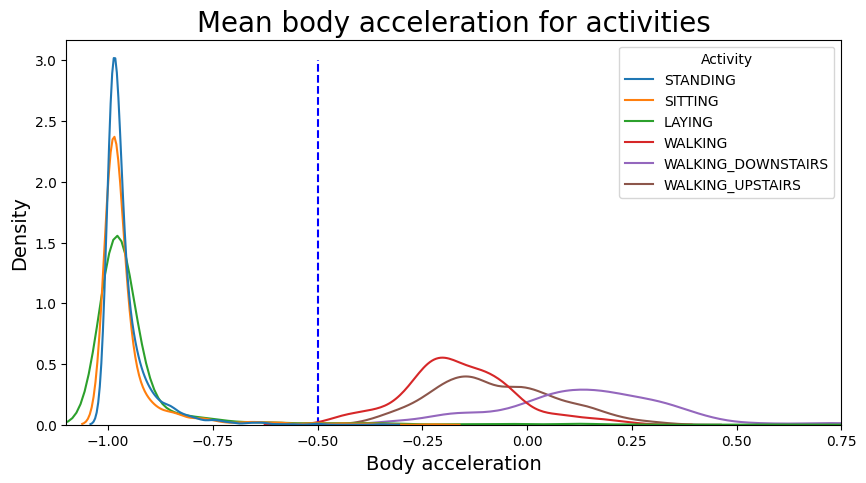

In [29]:
plt.figure(figsize = (10, 5))
plt.plot([-0.5,-0.5], [0, 3], linestyle = '--', color = 'blue', label = 'Пунктирная линия')
sns.kdeplot(data = train, x = "tBodyAccMag-mean()", hue = "Activity")
plt.xlim(-1.1, 0.75)
plt.xlabel("Body acceleration", fontsize = 14)
plt.ylabel("Density", fontsize = 14)
plt.title("Mean body acceleration for activities", fontsize = 20)
plt.show()


In [30]:
dynam = train[train["tBodyAccMag-mean()"] >= -0.5]["Activity"]
acctivity = len(dynam[dynam.isin(["WALKING_UPSTAIRS", "WALKING_DOWNSTAIRS", "WALKING"])])/len(dynam)
print(round(acctivity,2))

ne_dynam = train[train["tBodyAccMag-mean()"] < -0.5]["Activity"]
acctivity = len(ne_dynam[ne_dynam.isin(["STANDING", "SITTING", "LAYING"])])/len(ne_dynam)
print(round(acctivity,2))

0.98
1.0


#### Вероятно такое распределение обусловлено разной физической активностью. Ось икс. по-видимому, направлена вниз, поэтому, при стоянии, сидении и лежании ускорение, какое есть, в осномном спроецировано вниз. А в более активных случаях часть вектора ускорения направлена вперед, в стороны итп, поэтому проекция на ось икс меньше

### Задание 10 (0.5 балла)

Поздравляем, вы проверили первую гипотезу в процессе EDA. Однако нам бы хотелось уметь не группы разделять, а каждый отдельный вид активности. Попробуйте нарисовать "ящики с усами" для `angle(X,gravityMean)` с разделением по разным видам активности на данных train. Можно ли сделать какой-то вывод по полученной визуализации? Проанализируйте и проинтерпретируйте полученные картинки (если заметили какую-то особенность, может какая-то категория значительно выделяется, то предположите, почему так могло произойти).

Вам может пригодиться:
- sns.boxplot

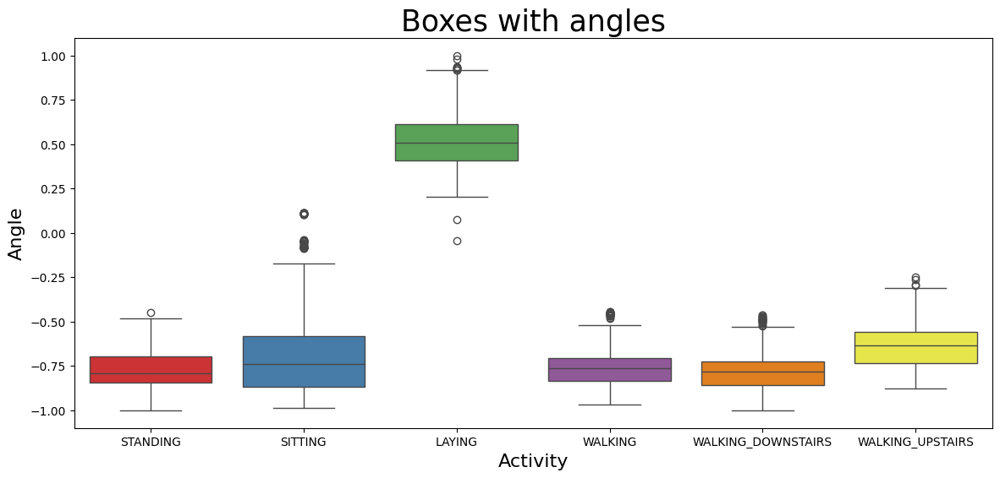

In [31]:
plt.figure(figsize = (14,6))
sns.boxplot(data = train, x = "Activity", y = "angle(X,gravityMean)", palette = "Set1")
plt.ylabel("Angle", fontsize = 16)
plt.xlabel("Activity", fontsize = 16)
plt.title("Boxes with angles", fontsize = 25)
plt.show()

Сложно сказать с чем это может быть связано, вероятно дело в изменении положения человека. Если оси X Y и Z жестко закреплены в пространстве, тогда это не аргумент, (например телефон может определять где низ и где север и ориентируется по ним), и кстати, данное предположение, вероятно, неверно, потому что тогда бы проекции очень сильно бы менялись, так как человек ходит не строго в одном направлении, а предпосылок, указывающих на это, я не обнаружил.

Но вот если оси прикреплены к телефону, который, вероятно, остается стаблильным относительно человека, тогда другое дело. При всех видах акивности оси направлены одинаково, кроме лежания: при лежании переворачивается телефон, а вместе с ним и оси, соотсевтвенно проекции ускорения тоже будут иными.

### Задание 11 (0.5 балла)

Посмотрим теперь на `tBodyAcc-max()-X`. Визуализируйте скрипичные диаграммы для этого признака с разделением по активностям на всем train. Кажется логичным, что максимальное ускорение в моменте для разных активностей будет различаться. Однако есть ли активность, которая будет выделяться? Если да, то предложите объяснение, почему эта активность выделяется.

Вам может пригодиться:
- sns.violinplot

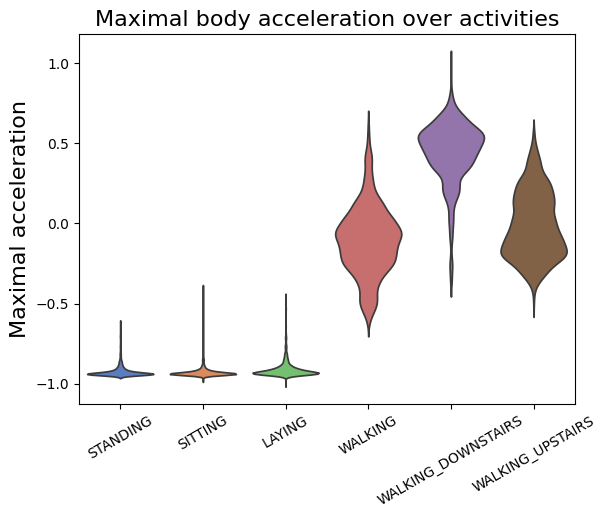

In [32]:
sns.violinplot(data=train, x='Activity', y='tBodyAcc-max()-X', palette='muted', bw=0.2, scale='width', inner=None)

plt.title('Maximal body acceleration over activities', fontsize = 16)
plt.xlabel("")
plt.ylabel('Maximal acceleration', fontsize = 16)
plt.xticks(rotation = 30)

plt.show()

#### Видно, что у WALKING_DOWNSTAIRS наибольшее среднее значение по acceleration. Это может быть объяснено тем, что при спуске с лестницы человек приобретает ускорение за счет небольшого промежутка свободного падения.

### Задание 12 (1 балл)

Вы уже можете с довольно хорошим качеством выделить две категории активности из шести. Продолжим.

Ранее уже упоминалось разделение на две группы активностей: статические и динамические. Пришла пора разделить датасет train на две части. Сделайте это! Теперь на одной картинке покажите распределения `fBodyAcc-bandsEnergy()-1,8.2` для динамичных активностей (`boxenplot` - немного измененый "ящик с усами") и `angle(Y,gravityMean)` для статических - тут хватит и простой гистограммы (прямо, как в примере ниже). Можно ли выделить еще какие-то активности? Если да, напишите, какие активности на 1 и 2 графиках выделяются.

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec (заметили, что один график больше другого? попробуйте сами так сделать - вам понравится...)
- sns.boxenplot
- sns.histplot

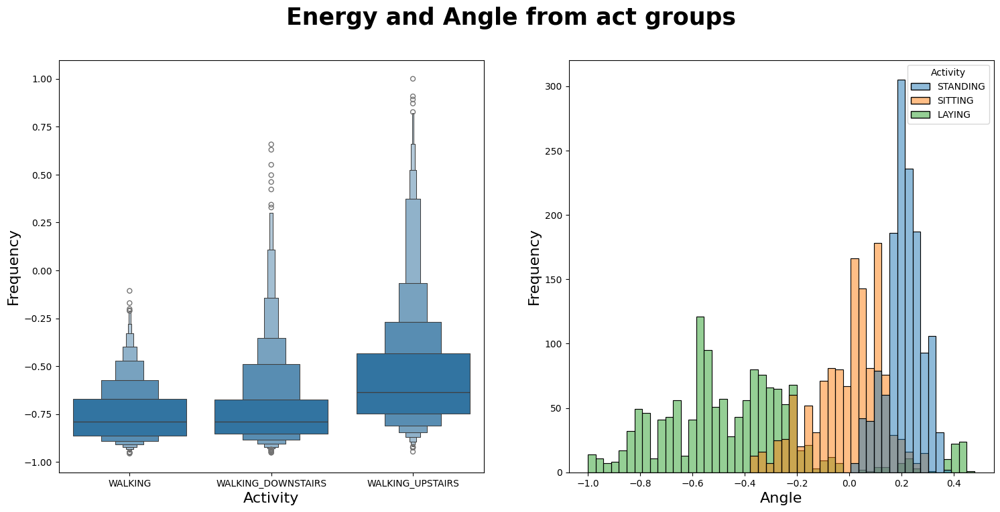

In [33]:
lazy = ["SITTING", "STANDING", "LAYING"]
aktive = ["WALKING_UPSTAIRS", "WALKING_DOWNSTAIRS", "WALKING"]

lazy = train[train["Activity"].isin(lazy)]
aktive = train[train["Activity"].isin(aktive)]

fig, axs = plt.subplots(1, 2, figsize = (18, 8))
sns.boxenplot(data = aktive, x = "Activity", y = "fBodyAcc-bandsEnergy()-1,8.2", ax = axs[0])
axs[0].set_xlabel("Activity",fontsize = 16)
axs[0].set_ylabel("Frequency",fontsize = 16)


plt.subplot(1, 2, 2)
sns.histplot(lazy, x = "angle(Y,gravityMean)", hue = "Activity", bins = 50, ax = axs[1])
axs[1].set_xlabel("Angle",fontsize = 16)
axs[1].set_ylabel("Frequency",fontsize = 16)
fig.suptitle("Energy and Angle from act groups", fontsize=25, fontweight = "bold")

plt.show()

### Задание 13 (0.5 балла)

Не всегда жизнь будет такой легкой, а данные будут полностью или почти линейно разделимы в одному признаку (иначе чем бы занимались дата саентисты...). Часто данные вообще ни по одному признаку нельзя адекватно разделить (да и по комбинациям признаков тоже). Давайте попробуем взять не один признак, а целых два!

Рассмотрим только статические активности. Будет снова два графика сразу. На первом графике будет боксплот распределения `fBodyAcc-skewness()-X` по активностям. А на втором попробуем взять не все наблюдения данной группы активностей, а только их часть. Разделимы ли категории по `fBodyAcc-skewness()-X`? А если взять только те строки, где `fBodyAcc-skewness()-X < -0.376`, и теперь вывести боксплот распределения `angle(Y,gravityMean)` по разным активностям? Попробуйте и напишите, выделилась ли какая-то категория?

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.boxplot

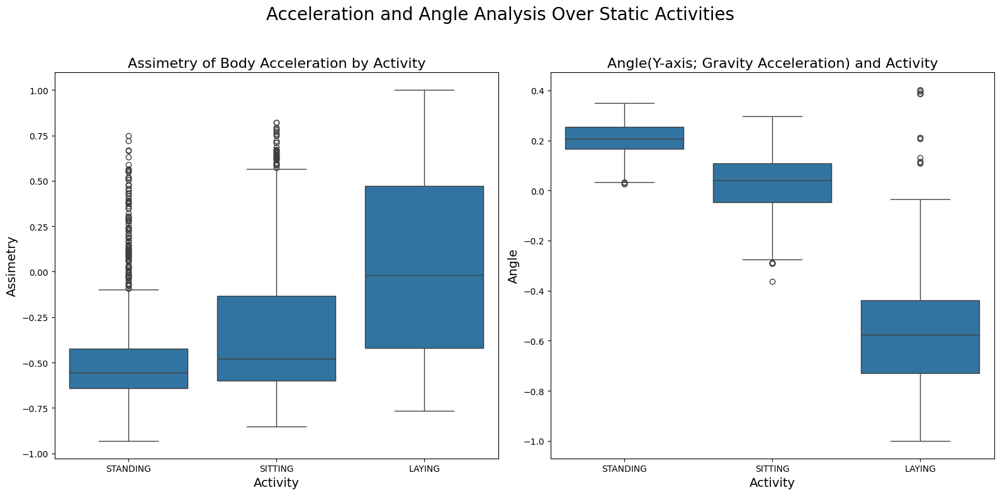

In [34]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

sns.boxplot(data = lazy,  x = "Activity", y = "fBodyAcc-skewness()-X", ax = axs[0])
axs[0].set_xlabel("Activity", fontsize = 14)
axs[0].set_ylabel("Assimetry", fontsize = 14)
axs[0].set_title("Assimetry of Body Acceleration by Activity", fontsize = 16)

filt = lazy[lazy["fBodyAcc-skewness()-X"] < -0.376]
sns.boxplot(data = filt, x = "Activity", y = "angle(Y,gravityMean)", ax = axs[1])
axs[1].set_xlabel("Activity", fontsize = 14)
axs[1].set_ylabel("Angle", fontsize = 14)
axs[1].set_title("Angle(Y-axis; Gravity Acceleration) and Activity", fontsize = 16)


fig.suptitle("Acceleration and Angle Analysis Over Static Activities", fontsize = 20)
plt.tight_layout(rect = [0, 0, 1, 0.95])
plt.show()



Поздравляем, теперь вы на шажок ближе к тому, чтобы стать решающим деревом!

### Задание 14 (1 балл)

Вот и осталась лишь одна активность, которую мы никак не выделили. Попробуем и ее какими-то порогами отделить от всех остальных. Да, можно было бы сказать, что, раз уж мы выделили 5 из 6 категорий, то все остальное - это и есть последняя категория, но мы не идем легкими путями. Выделить оставшуюсь категорию с хорошим качеством не так уж и просто. Из доступных признаков, сначала посмотрите на распределение `tBodyAcc-max()-X` на динамических активностях (скрипичная диаграмма отлично подойдет).

А теперь спускаем вам порог `tBodyAcc-max()-X < 0.157`. Для таких строк постройте диаграмму рассеяния для признака `tGravityAcc-min()-X`. Да, получается неидеально, но это честная работа. Можно выбрать порог так, чтобы чисто из таблицы с динамическими активностями из строк, где `tBodyAcc-max()-X < 0.157`, выбрать по некоторому порогу для `tGravityAcc-min()-X` строки так, чтобы доля правильных ответов на оставшейся категории была не меньше 83%!

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.violinplot
- sns.swarmplot (иногда лучше подходит, чем просто sns.scatterplot)

Обратите внимание, что подписи к осям можно убирать методами plt. Например, если у вас общее название для оси Y для обоих графиков, то можно не подписывать ось Y у второго графика.

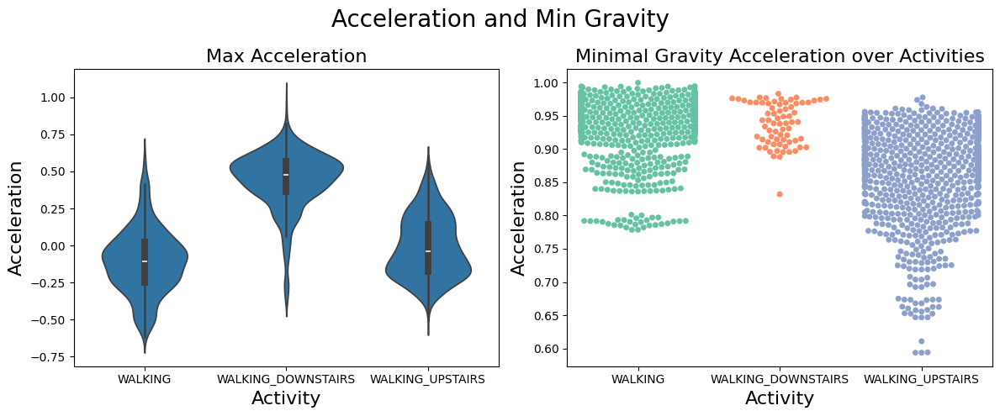

In [35]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("Acceleration and Min Gravity", fontsize = 20)
sns.violinplot(data = aktive, x = "Activity", y = "tBodyAcc-max()-X", ax=axs[0])
axs[0].set_title("Max Acceleration", fontsize = 16)
axs[0].set_xlabel("Activity",fontsize = 16)
axs[0].set_ylabel("Acceleration",fontsize = 16)
filt = aktive[aktive["tBodyAcc-max()-X"] < 0.157]
sns.swarmplot(data = filt, x = "Activity", y = "tGravityAcc-min()-X", palette = "Set2", ax = axs[1])
axs[1].set_title("Minimal Gravity Acceleration over Activities",fontsize = 16)
axs[1].set_xlabel("Activity",fontsize = 16)
axs[1].set_ylabel("Acceleration",fontsize = 16)
plt.tight_layout()
plt.show()


### Задание 15 (0.5 балла)

Теперь попробуем более интерактивные графики. Установите библиотеку `plotly` (обычно `pip install plotly` или `conda install plotly`). Синтаксис очень похож на `seaborn`, но вот [документация для plotly.express](https://plotly.com/python-api-reference/plotly.express.html).

Сначала подготовим данные для визуализации. Будем считать t-SNE просто "черным ящиком", который принимает наши данные и проецирует их в двумерное или трехмерное пространство. Возможно, придется немного подождать.

In [48]:
import plotly
import time
start_time = time.time()
from sklearn.manifold import TSNE
tsne = TSNE(random_state=666, n_components=2)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_2_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y']),
    train['Activity']
], axis=1)

tsne = TSNE(random_state=666, n_components=3)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_3_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y', 'z']),
    train['Activity']
], axis=1)
end_time = time.time()
execution_time = end_time - start_time
print(f"Время выполнения: {execution_time:.4f} секунд")

Время выполнения: 232.7888 секунд


Теперь нарисуйте scatter-график через `plotly.express` для `df_2_comp` с выделением цветами активностей. Красиво получилось? Видны скопления точек одного цвета? Можно разные активности отделить линиями на данном графике?

In [49]:
import plotly.express as px
fig = px.scatter(df_2_comp, x = "x", y = "y", color = "Activity",title = "Scatter Plot")
fig.show()

#### Вау! Вышло очень красиво! Появилось желание узнать, как оно работает на самом деле. 
В целом сидячие категории вполне отделимы друг от друга, между активными в целом тоже можно провести некоторую разделяющую линию, но видно, что взбирание вверх по лестнице и спускание вниз по лестнице трудноотличимы.

Мы не отстаем от трендов и тоже можем в 3D. Сейчас и вы научитесь (если еще не умеете). Нарисуйте scatter_3d-график через `plotly.express` для `df_3_comp` с выделением цветами активностей. Повращайте его. Нормально получилось? Есть ли какая-то структура у точек?

In [54]:
fig = px.scatter_3d(df_3_comp, x = "x", y = "y", z = "z", color = "Activity", title = "3D Scatter Plot")
fig.show()

### Задание 16 (1 балл)

Мы сделали вам fit. Ваша очередь сделать predict. Допишите функцию, которая принимает на вход датафрейм с признаками, а выдает вектор из предсказаний - для каждой строки датафрейма вы определяете, к какому классу принадлежит объект. Рекомендуем сразу записывать из строками, а не кодировать в числа. Дальше фукнция `accuracy_score` выдаст вам долю правильных ответов.

Подсказка: вы уже отделили категории друг от друга по каким-то признакам. Воспользуйтесь этим знанием! Используя только проведенный вами анализ можно спокойно выбить не менее 75% на train и test! Если вы получите меньше 75%, то балл будет снижен. Авторское решение (на основе всех графиков выше) выбивает 81% и 77% на train и test соответственно. [Шпаргалка с готовыми идеями для такой задачи](https://rutube.ru/video/f884aa6ed5f94120b7304506042fe5bb/)

In [71]:
def predict_sample(data):
    if data["tBodyAccMag-mean()"] < -0.5:
        if data["angle(X,gravityMean)"] > 0.2:
            return "LAYING"
        else:
            if data["fBodyAcc-skewness()-X"] < -0.376:
                if data["angle(Y,gravityMean)"] < 0.15:
                    return "SITTING"
                else:
                    return "STANDING"
    else:
        if data["tBodyAcc-max()-X"] < 0.1:
            if data["tGravityAcc-min()-X"] > 0.9:
                return "WALKING"
            else:
                return "WALKING_UPSTAIRS"
        else:
            return "WALKING_DOWNSTAIRS"
    return "SITTING"

def predict(data):
    result = []
    for i in data.to_dict(orient = "records"):
        result = result + [predict_sample(i)]
    return result

def accuracy_score(y_true, y_pred) -> float:
    y_true = np.asarray(y_true).reshape(-1, 1)
    y_pred = np.asarray(y_pred).reshape(-1, 1)
    return (y_true == y_pred).mean()

In [74]:
train_preds = predict(train)
test_preds = predict(test)
print(f"Accuracy on train set => {accuracy_score(train['Activity'], train_preds)}")
print(f"Accuracy on test set => {accuracy_score(test['Activity'], test_preds)}")

Accuracy on train set => 0.7916213275299239
Accuracy on test set => 0.7621309806582965


__Место для мема и/или фидбэка__

> тут

Домашки интересные и прикольные! Все было понятно и достаточно ясно как делать каждый номер. Особенно понравилось строить и проверять гипотезы

In [2]:
from sklearn.metrics import roc_auc_score

true_labels = [1, 0, 0, 1, 0, 0, 1, 1, 0,0]
probabilities = [0.5, 0.1, 0.2, 0.3, 0.4, 0.3, 0.8, 0.9, 0.4,0.5]

roc_auc = roc_auc_score(true_labels, probabilities)
print("ROC AUC:", roc_auc)


ROC AUC: 0.8333333333333333
